<a href="https://colab.research.google.com/github/Ani0201/codershub/blob/master/Copy_of_Tensorflow_2_Object_Detection_Train_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tensorflow 2 Object Detection: Train model



<table align="left"><td>
  <a target="_blank"  href="https://colab.research.google.com/github/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab
  </a>
</td><td>
  <a target="_blank"  href="https://github.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/Tensorflow_2_Object_Detection_Train_model.ipynb">
    <img width=32px src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View source on GitHub</a>
</td></table>

This notebook walks you through training a custom object detection model using the Tensorflow Object Detection API and Tensorflow 2.

The notebook is split into the following parts:
* Install the Tensorflow Object Detection API
* Prepare data for use with the OD API
* Write custom training configuration
* Train detector
* Export model inference graph
* Test trained model

![Microcontroller Detection](https://github.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/doc/output.png?raw=1)

## Installation

Installing the Tensorflow Object Detection API became a lot easier with the relase of Tensorflow 2. The following few cells are all that is needed in order to install the OD API.

In [1]:
!pip install tensorflow=="2.6.0"

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached tensorflow-2.6.0-cp38-cp38-manylinux2010_x86_64.whl (458.4 MB)
  Using cached numpy-1.19.5-cp38-cp38-manylinux2010_x86_64.whl (14.9 MB)
  Using cached absl_py-0.15.0-py3-none-any.whl (132 kB)
  Using cached flatbuffers-1.12-py2.py3-none-any.whl (15 kB)
  Attempting uninstall: flatbuffers
    Found existing installation: flatbuffers 23.1.21
    Uninstalling flatbuffers-23.1.21:
      Successfully uninstalled flatbuffers-23.1.21
  Attempting uninstall: numpy
    Found existing installation: numpy 1.22.4
    Uninstalling numpy-1.22.4:
      Successfully uninstalled numpy-1.22.4
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.11.0
    Uninstalling tensorflow-2.11.0:
      Successfully uninsta

In [2]:
import os
import pathlib

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
  while "models" in pathlib.Path.cwd().parts:
    os.chdir('..')
elif not pathlib.Path('models').exists():
  !git clone --depth 1 https://github.com/tensorflow/models

In [3]:
# Install the Object Detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached numpy-1.24.2-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (17.3 MB)
  Using cached tensorflow-2.11.0-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (588.3 MB)
  Using cached numpy-1.22.4-cp38-cp38-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (16.9 MB)
  Using cached absl_py-1.4.0-py3-none-any.whl (126 kB)
  Using cached flatbuffers-23.1.21-py2.py3-none-any.whl (26 kB)
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1696777 sha256=aa300d80b89c5852c0a7cdaa3a2970ef48bb95d7e9684161c2e416aa3232cb2a
  Stored in directory: /tmp/pip-ephem-wheel-cache-mhc9hvtg/wheels/7d/96/c1/072a751379735e8dfdada1def1c62a89afb3cc45654fd6fd28
Successfully built object-detection
  Attempting uninstal

In [4]:
#run model builder test
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

2023-02-14 05:09:05.376667: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-14 05:09:07.785030: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:09:07.785283: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:09:07.785322: W tensorfl

## Prepare data

To train a robust model, you need a lot of pictures that vary greatly from each other. You can either take the pictures yourself or you can download them from the internet.

After collecting the images you need to label them. For this I recommend using [LabelImg](https://github.com/tzutalin/labelImg) - an free, open source graphical image annotation tool.

![LabelImg](https://raw.githubusercontent.com/tzutalin/labelImg/master/demo/demo3.jpg)

After labeling the images, split the data into a training and testing part and convert the xml label files to csv using the [xml_to_csv.py](https://github.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/blob/master/xml_to_csv.py) script.

I uploaded my Microcontroller Detection data-set on Kaggle. The below four cells are used to download and extract the data-set.

In [5]:
# Install Kaggle API
!pip install -q kaggle
!pip install -q kaggle-cli

  Preparing metadata (setup.py) ... done
  error: subprocess-exited-with-error
  
  × python setup.py bdist_wheel did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  ERROR: Failed building wheel for lxml
  error: subprocess-exited-with-error
  
  × Running setup.py install for lxml did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Running setup.py install for lxml ... error
error: legacy-install-failure

× Encountered error while trying to install package.
╰─> lxml

note: This is an issue with the package mentioned above, not pip.
hint: See above for output from the failure.


In [6]:
# only for google colab
import os
os.environ['KAGGLE_USERNAME'] = "aniruddh0201" 
os.environ['KAGGLE_KEY'] = "c3de783146a9a4dab09b0a768f101fe4"

In [7]:
!kaggle datasets download -d aniruddh0201/uno-cards --unzip

 98% 157M/160M [00:01<00:00, 140MB/s]
100% 160M/160M [00:01<00:00, 125MB/s]


In [ ]:
!mv "Microcontroller Detection" microcontroller-detection

mv: cannot stat 'Microcontroller Detection': No such file or directory


In [ ]:
!wget https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/generate_tfrecord.py

In [ ]:
!wget https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/training/labelmap.pbtxt

--2020-07-18 15:54:58--  https://raw.githubusercontent.com/TannerGilbert/Tensorflow-Object-Detection-API-Train-Model/master/training/labelmap.pbtxt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 177 [text/plain]
Saving to: ‘labelmap.pbtxt’

labelmap.pbtxt      100%[===================>]     177  --.-KB/s    in 0s      

2020-07-18 15:54:58 (12.3 MB/s) - ‘labelmap.pbtxt’ saved [177/177]



In [8]:
!python /content/generate_tfrecord.py --csv_input=/content/train_labels.csv --image_dir=/content/train --output_path=/content/train.record
!python /content/generate_tfrecord.py --csv_input=/content/test_labels.csv --image_dir=/content/test --output_path=/content/test.record

2023-02-14 05:10:59.455699: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-14 05:11:01.041287: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:11:01.041452: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:11:01.041476: W tensorfl

In [9]:
train_record_path = '/content/train.record'
test_record_path = '/content/test.record'
labelmap_path = '/content/labelmap.pbtxt'

## Configuring training

Now that the data is ready it's time to create a training configuration. The OD API supports lots of models, each with its own config file. In this notebook I'm making use of EfficientDet, but you can replace it with any model available in the [Tensorflow 2 Detection Model Zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md).

In [10]:
batch_size = 1
num_steps = 4000
num_eval_steps = 500

In [11]:
!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz
!tar -xf faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz

--2023-02-14 05:11:07--  http://download.tensorflow.org/models/object_detection/tf2/20200711/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 108.177.112.128, 2607:f8b0:4001:c10::80
Connecting to download.tensorflow.org (download.tensorflow.org)|108.177.112.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 359156023 (343M) [application/x-tar]
Saving to: ‘faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz.1’

faster_rcnn_resnet1 100%[===================>] 342.52M   237MB/s    in 1.4s    

2023-02-14 05:11:09 (237 MB/s) - ‘faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.tar.gz.1’ saved [359156023/359156023]



In [12]:
fine_tune_checkpoint = '/content/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8/checkpoint/ckpt-0'

In [13]:
!wget https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.config

base_config_path = 'faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.config'

--2023-02-14 05:11:17--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3443 (3.4K) [text/plain]
Saving to: ‘faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.config.1’

faster_rcnn_resnet1 100%[===================>]   3.36K  --.-KB/s    in 0s      

2023-02-14 05:11:17 (27.9 MB/s) - ‘faster_rcnn_resnet101_v1_800x1333_coco17_gpu-8.config.1’ saved [3443/3443]



In [14]:
# edit configuration file (from https://colab.research.google.com/drive/1sLqFKVV94wm-lglFq_0kGo2ciM0kecWD)

import re

with open(base_config_path) as f:
    config = f.read()

with open('model_config.config', 'w') as f:
  
  # Set labelmap path
  config = re.sub('label_map_path: ".*?"', 
             'label_map_path: "{}"'.format(labelmap_path), config)
  
  # Set fine_tune_checkpoint path
  config = re.sub('fine_tune_checkpoint: ".*?"',
                  'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), config)
  
  # Set train tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 
                  'input_path: "{}"'.format(train_record_path), config)
  
  # Set test tf-record file path
  config = re.sub('(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 
                  'input_path: "{}"'.format(test_record_path), config)
  
  # Set number of classes.
  config = re.sub('num_classes: [0-9]+',
                  'num_classes: {}'.format(5), config)
  
  # Set batch size
  config = re.sub('batch_size: [0-9]+',
                  'batch_size: {}'.format(batch_size), config)
  
  # Set training steps
  config = re.sub('num_steps: [0-9]+',
                  'num_steps: {}'.format(num_steps), config)
  
  # Set warmup steps for learning rate
  config = re.sub('warmup_steps: [0-9]+',
                  'warmup_steps: {}'.format(500), config)
  
  # Set total steps
  config = re.sub('total_steps: [0-9]+',
                  'total_steps: {}'.format(8000), config)
  
  # Set fine-tune checkpoint type to detection
  config = re.sub('fine_tune_checkpoint_type: "classification"', 
             'fine_tune_checkpoint_type: "{}"'.format('detection'), config)
  
  f.write(config)

In [15]:
%cat model_config.config

# Faster R-CNN with Resnet-101 (v1),
# Initialized from Imagenet classification checkpoint
#
# Train on GPU-8
#
# Achieves 36.6 mAP on COCO17 val

model {
  faster_rcnn {
    num_classes: 5
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 800
        max_dimension: 1333
        pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: 'faster_rcnn_resnet101_keras'
    }
    first_stage_anchor_generator {
      grid_anchor_generator {
        scales: [0.25, 0.5, 1.0, 2.0]
        aspect_ratios: [0.5, 1.0, 2.0]
        height_stride: 16
        width_stride: 16
      }
    }
    first_stage_box_predictor_conv_hyperparams {
      op: CONV
      regularizer {
        l2_regularizer {
          weight: 0.0
        }
      }
      initializer {
        truncated_normal_initializer {
          stddev: 0.01
        }
      }
    }
    first_stage_nms_score_threshold: 0.0
    first_stage_nms_iou_threshold: 0.7
    first_stage_max_proposals: 300
   

In [16]:
model_dir = '/content/training/'
pipeline_config_path = 'model_config.config'

## Train detector

In [18]:
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_config_path} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2023-02-14 05:11:17.997191: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-02-14 05:11:19.829710: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer.so.7'; dlerror: libnvinfer.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:11:19.829899: W tensorflow/compiler/xla/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libnvinfer_plugin.so.7'; dlerror: libnvinfer_plugin.so.7: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/nvidia/lib:/usr/local/nvidia/lib64
2023-02-14 05:11:19.830237: W tensorfl

In [17]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

Reusing TensorBoard on port 6006 (pid 7488), started 0:23:22 ago. (Use '!kill 7488' to kill it.)

<IPython.core.display.Javascript object>

## Export model inference graph

In [ ]:
output_directory = 'inference_graph'

!python /content/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {model_dir} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_config_path}

2020-07-18 18:08:42.450130: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcudart.so.10.1
I0718 18:08:46.165607 140076592244608 ssd_efficientnet_bifpn_feature_extractor.py:144] EfficientDet EfficientNet backbone version: efficientnet-b0
I0718 18:08:46.165880 140076592244608 ssd_efficientnet_bifpn_feature_extractor.py:145] EfficientDet BiFPN num filters: 64
I0718 18:08:46.166004 140076592244608 ssd_efficientnet_bifpn_feature_extractor.py:147] EfficientDet BiFPN num iterations: 3
I0718 18:08:46.182794 140076592244608 efficientnet_model.py:146] round_filter input=32 output=32
2020-07-18 18:08:46.199456: I tensorflow/stream_executor/platform/default/dso_loader.cc:44] Successfully opened dynamic library libcuda.so.1
2020-07-18 18:08:46.233530: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:981] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
202

In [ ]:
from google.colab import files
files.download(f'/content/{output_directory}/saved_model/saved_model.pb') 

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Test trained model on test images

based on [Object Detection API Demo](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/object_detection_tutorial.ipynb) and [Inference from saved model tf2 colab](https://github.com/tensorflow/models/blob/master/research/object_detection/colab_tutorials/inference_from_saved_model_tf2_colab.ipynb).

In [ ]:
import io
import os
import scipy.misc
import numpy as np
import six
import time
import glob
from IPython.display import display

from six import BytesIO

import matplotlib
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw, ImageFont

import tensorflow as tf
from object_detection.utils import ops as utils_ops
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util

%matplotlib inline

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path (this can be local or on colossus)

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
category_index = label_map_util.create_category_index_from_labelmap(labelmap_path, use_display_name=True)

In [ ]:
tf.keras.backend.clear_session()
model = tf.saved_model.load(f'/content/{output_directory}/saved_model')

In [ ]:
def run_inference_for_single_image(model, image):
  image = np.asarray(image)
  # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
  input_tensor = tf.convert_to_tensor(image)
  # The model expects a batch of images, so add an axis with `tf.newaxis`.
  input_tensor = input_tensor[tf.newaxis,...]

  # Run inference
  model_fn = model.signatures['serving_default']
  output_dict = model_fn(input_tensor)

  # All outputs are batches tensors.
  # Convert to numpy arrays, and take index [0] to remove the batch dimension.
  # We're only interested in the first num_detections.
  num_detections = int(output_dict.pop('num_detections'))
  output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
  output_dict['num_detections'] = num_detections

  # detection_classes should be ints.
  output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)
   
  # Handle models with masks:
  if 'detection_masks' in output_dict:
    # Reframe the the bbox mask to the image size.
    detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
              output_dict['detection_masks'], output_dict['detection_boxes'],
               image.shape[0], image.shape[1])      
    detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                       tf.uint8)
    output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()
    
  return output_dict

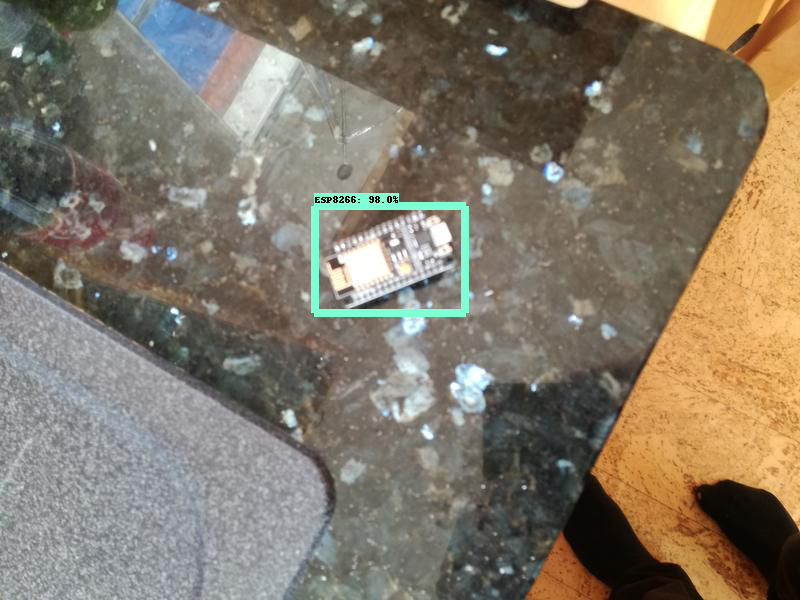

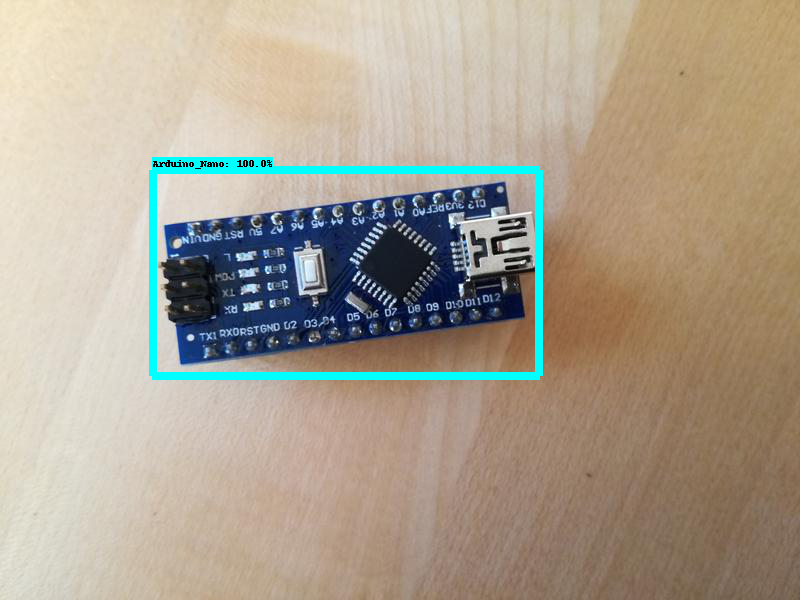

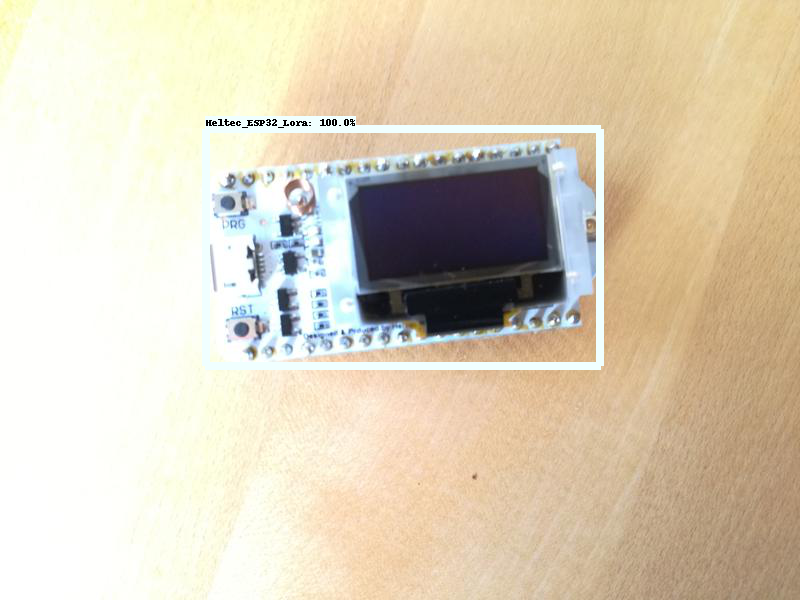

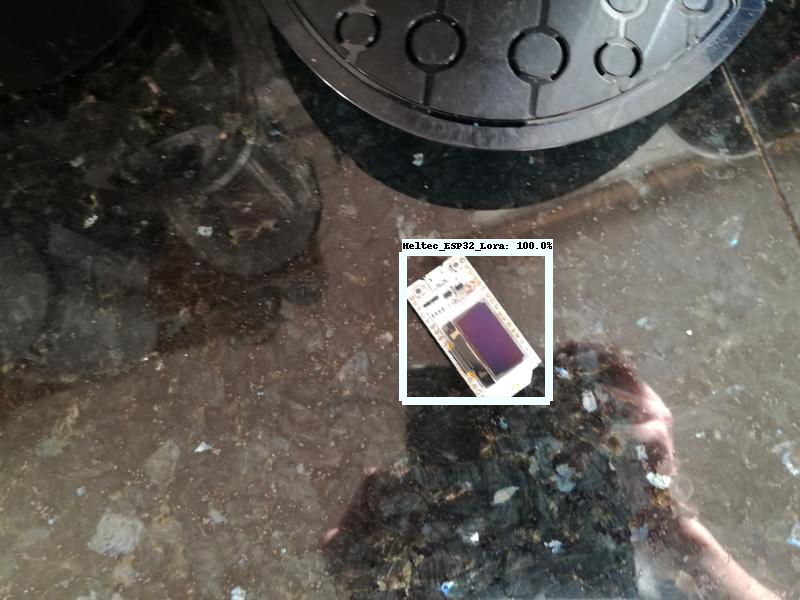

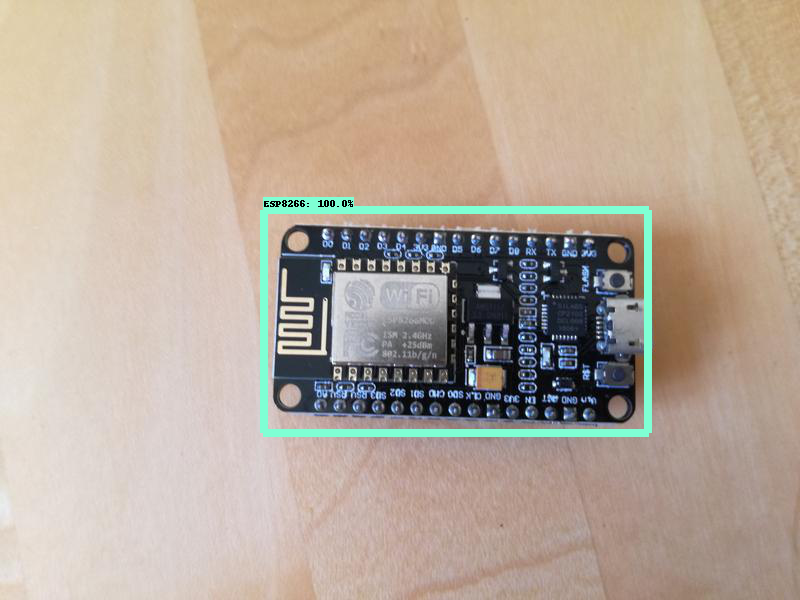

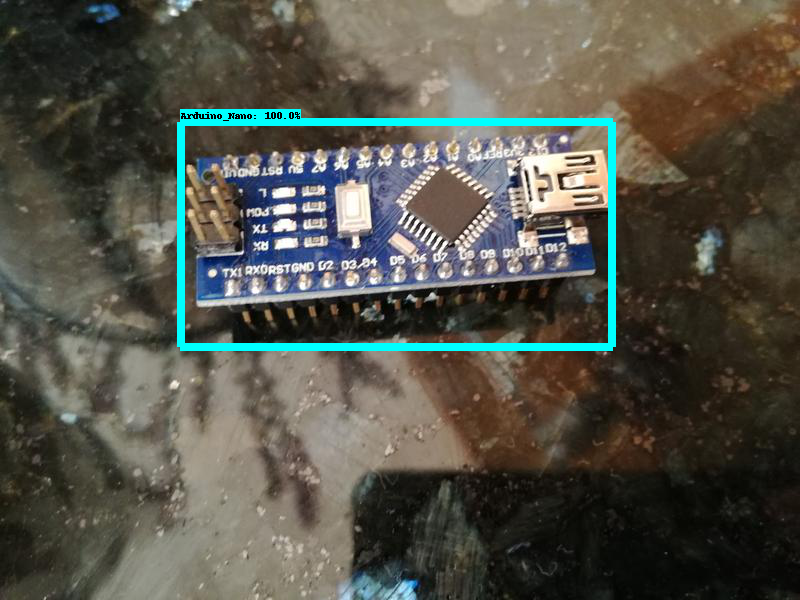

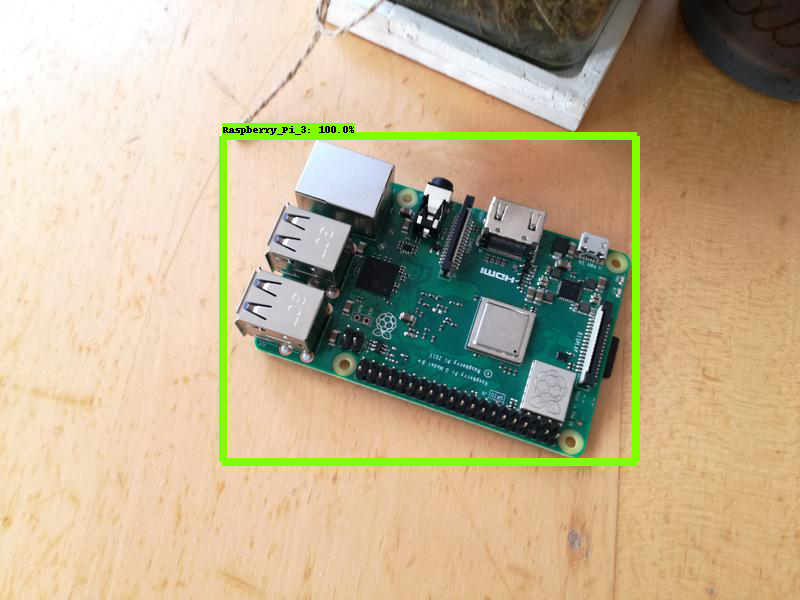

In [ ]:
for image_path in glob.glob('microcontroller-detection/test/*.jpg'):
  image_np = load_image_into_numpy_array(image_path)
  output_dict = run_inference_for_single_image(model, image_np)
  vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)
  display(Image.fromarray(image_np))